### Student Information
Name: Jansen Christopher Yuanda

Student ID: 109006267

GitHub ID: jansenchristophery

---

### Instructions

1. First: do the **take home** exercises in the [DM2023-Lab1-Master](https://github.com/fjrialdnc0615/DM2023-Lab1-Master). You may need to copy some cells from the Lab notebook to this notebook. __This part is worth 20% of your grade.__


2. Second: follow the same process from the [DM2023-Lab1-Master](https://github.com/fjrialdnc0615/DM2023-Lab1-Master) on **the new dataset**. You don't need to explain all details as we did (some **minimal comments** explaining your code are useful though).  __This part is worth 30% of your grade.__
    - Download the [the new dataset](https://archive.ics.uci.edu/ml/datasets/Sentiment+Labelled+Sentences#). The dataset contains a `sentence` and `score` label. Read the specificiations of the dataset for details. You need to combine three labeled datasets into one file for your data preparation part.
    - You are allowed to use and modify the `helper` functions in the folder of the first lab session (notice they may need modification) or create your own.


3. Third: please attempt the following tasks on **the new dataset**. __This part is worth 30% of your grade.__
    - Generate meaningful **new data visualizations**. Refer to online resources and the Data Mining textbook for inspiration and ideas. 
    - Generate **TF-IDF features** from the tokens of each text. This will generating a document matrix, however, the weights will be computed differently (using the TF-IDF value of each word per document as opposed to the word frequency). Refer to this Sciki-learn [guide](http://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html) .
    - Implement a simple **Naive Bayes classifier** that automatically classifies the records into their categories. Use both the TF-IDF features and word frequency features to build two seperate classifiers. Comment on the differences.  Refer to this [article](https://hub.packtpub.com/implementing-3-naive-bayes-classifiers-in-scikit-learn/).


4. Fourth: In the lab, we applied each step really quickly just to illustrate how to work with your dataset. There are somethings that are not ideal or the most efficient/meaningful. Each dataset can be habdled differently as well. What are those inefficent parts you noticed? How can you improve the Data preprocessing for these specific datasets? __This part is worth 10% of your grade.__


5. Fifth: It's hard for us to follow if your code is messy, so please **tidy up your notebook** and **add minimal comments where needed**. __This part is worth 10% of your grade.__


You can submit your homework following these guidelines: [Git Intro & How to hand your homework](https://github.com/fjrialdnc0615/DM2023-Lab1-Master/blob/main/Git%20Intro%20%26%20How%20to%20hand%20your%20homework.ipynb). Make sure to commit and save your changes to your repository __BEFORE the deadline (October 27th 11:59 pm, Thursday)__. 

In [1]:
### Begin Assignment Here 
# TEST necessary for when working with external scripts
%load_ext autoreload
%autoreload 2

# Part 1. Take Home Exercises

In [2]:
# categories
categories = ['alt.atheism', 'soc.religion.christian', 'comp.graphics', 'sci.med']
# obtain the documents containing the categories provided
from sklearn.datasets import fetch_20newsgroups

twenty_train = fetch_20newsgroups(subset='train', categories=categories,
                                  shuffle=True, random_state=42)
import pandas as pd
import sys
print(len(sys.path))
sys.path.insert(12,'C:\\Users\\Jansen Christopher\\DMLab1\\DM2023-Lab1-Master')
# my functions
import helpers.data_mining_helpers as dmh

# construct dataframe from a list
X = pd.DataFrame.from_records(dmh.format_rows(twenty_train.data), columns= ['text'])
# add category to the dataframe
X['category'] = twenty_train.target
# add category label also
X['category_name'] = X.category.apply(lambda t: dmh.format_labels(t, twenty_train))

12


### ** >>> Exercise 2 (take home):** 
Experiment with other querying techniques using pandas dataframes. Refer to their [documentation](https://pandas.pydata.org/pandas-docs/stable/indexing.html) for more information. 

In [3]:
#Answer here
X[X['category_name'] == 'sci.med'].iloc[::10][:5]
#fetch records belonging to the sci.med category, and query every 10th record. Only show the first 5 records.

,text,category,category_name
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,2,sci.med
49,From: jimj@contractor.EBay.Sun.COM (Jim Jones)...,2,sci.med
82,From: jason@ab20.larc.nasa.gov (Jason Austin) ...,2,sci.med
118,From: rogers@calamari.hi.com (Andrew Rogers) S...,2,sci.med
142,From: lady@uhunix.uhcc.Hawaii.Edu (Lee Lady) S...,2,sci.med


### >>> **Exercise 5 (take home)** 
There is an old saying that goes, "The devil is in the details." When we are working with extremely large data, it's difficult to check records one by one (as we have been doing so far). And also, we don't even know what kind of missing values we are facing. Thus, "debugging" skills get sharper as we spend more time solving bugs. Let's focus on a different method to check for missing values and the kinds of missing values you may encounter. It's not easy to check for missing values as you will find out in a minute.

Please check the data and the process below, describe what you observe and why it happened.   
$Hint$ :  why does `.isnull()` not work?

In [4]:
import numpy as np

NA_dict = [{ 'id': 'A', 'missing_example': np.nan },
           { 'id': 'B'                    },
           { 'id': 'C', 'missing_example': 'NaN'  },
           { 'id': 'D', 'missing_example': 'None' },
           { 'id': 'E', 'missing_example':  None  },
           { 'id': 'F', 'missing_example': ''     }]

NA_df = pd.DataFrame(NA_dict, columns = ['id','missing_example'])
NA_df
NA_df['missing_example'].isnull()

0     True
1     True
2    False
3    False
4     True
5    False
Name: missing_example, dtype: bool

In [5]:
# Answer here
# Because 'NaN', 'None', and '' is regarded as a string and not actually empty data
# While np.nan, , and None is actually empty data
# So the .isnull() function won't work because it sees strings as not empty data

def ismissing(x):
#check wether the value is None
    if x is np.nan or x is None or str(x) in ['NaN', 'None', '']:
        return True
    else:
        return False
NA_df['missing_example'].apply(ismissing)

0    True
1    True
2    True
3    True
4    True
5    True
Name: missing_example, dtype: bool

### >>> Exercise 6 (take home):
Notice any changes from the `X` dataframe to the `X_sample` dataframe? What are they? Report every change you noticed as compared to the previous state of `X`. Feel free to query and look more closely at the dataframe for these changes.

In [6]:
# Answer here
# only 1000 records instead of the original 2257 records
# additionally, the index also becomes scrambled
X_sample = X.sample(n=1000,random_state=42) #random state
print(X)
print("---------------------------------")
print(X_sample)

                                                   text  category  \
0     From: sd345@city.ac.uk (Michael Collier) Subje...         1   
1     From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...         1   
2     From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...         3   
3     From: s0612596@let.rug.nl (M.M. Zwart) Subject...         3   
4     From: stanly@grok11.columbiasc.ncr.com (stanly...         3   
...                                                 ...       ...   
2252  From: roos@Operoni.Helsinki.FI (Christophe Roo...         2   
2253  From: mhollowa@ic.sunysb.edu (Michael Holloway...         2   
2254  From: sasghm@theseus.unx.sas.com (Gary Merrill...         2   
2255  From: Dan Wallach <dwallach@cs.berkeley.edu> S...         2   
2256  From: dyer@spdcc.com (Steve Dyer) Subject: Re:...         2   

               category_name  
0              comp.graphics  
1              comp.graphics  
2     soc.religion.christian  
3     soc.religion.christian  
4     soc.religi

### >>> **Exercise 8 (take home):** 
We can also do a side-by-side comparison of the distribution between the two datasets, but maybe you can try that as an excerise. Below we show you an snapshot of the type of chart we are looking for. 

category_name
soc.religion.christian    599
sci.med                   594
comp.graphics             584
alt.atheism               480
Name: count, dtype: int64
category_name
sci.med                   277
soc.religion.christian    270
comp.graphics             247
alt.atheism               206
Name: count, dtype: int64


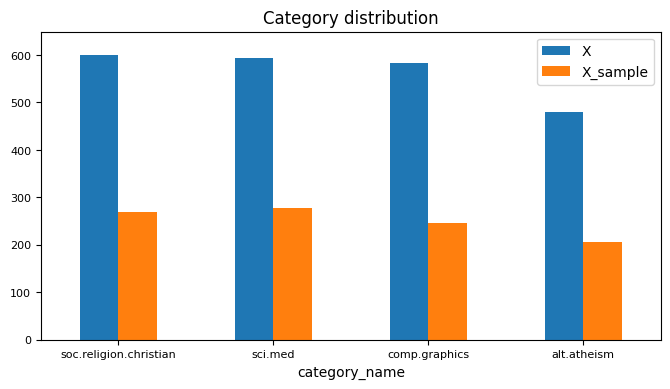

In [7]:
# #Answer here
import matplotlib.pyplot as plt
%matplotlib inline

print(X.category_name.value_counts())
print(X_sample.category_name.value_counts())

# Sort X_sample_value_counts based on the values in X_value_counts
X_sample_value_counts_sorted = X_sample.category_name.value_counts().reindex(index=X.category_name.value_counts().index)

# Combine the value counts into a single DataFrame
X_combined = pd.DataFrame({'X': X.category_name.value_counts(), 'X_sample': X_sample_value_counts_sorted})

# Calculate upper_bound as the maximum of X and X_sample
upper_bound = max(X_combined[['X', 'X_sample']].values.flatten()) + 50

# Create the bar plot
X_combined.plot(kind='bar',
                title='Category distribution',
                ylim=[0, upper_bound],
                rot=0, fontsize=8, figsize=(8, 4))

plt.show()

### **>>> Exercise 10 (take home):**
We said that the `1` at the beginning of the fifth record represents the `00` term. Notice that there is another 1 in the same record. Can you provide code that can verify what word this 1 represents from the vocabulary. Try to do this as efficient as possible.

In [8]:
from sklearn.feature_extraction.text import CountVectorizer

count_vect = CountVectorizer()
X_counts = count_vect.fit_transform(X.text) #learn the vocabulary and return document-term matrix

In [9]:
# Answer here
X_counts_array = X_counts[0:5, 0:100].toarray()
count=0
for i in X_counts_array[4]:
    if i==1:
        print(count_vect.get_feature_names_out()[count])
    count+=1
# The output below shows that it represents the "01" term

00
01


### **>>> Exercise 11 (take home):** 
From the chart above, we can see how sparse the term-document matrix is; i.e., there is only one terms with frequency of `1` in the subselection of the matrix. By the way, you may have noticed that we only selected 20 articles and 20 terms to plot the histrogram. As an excersise you can try to modify the code above to plot the entire term-document matrix or just a sample of it. How would you do this efficiently? Remember there is a lot of words in the vocab. Report below what methods you would use to get a nice and useful visualization

In [10]:
# # Sort the term frequencies in descending order
term_frequencies = []
print(X_counts.shape[1])
for j in range(0,X_counts.shape[1]):
    term_frequencies.append(sum(X_counts[:,j].toarray()))
term_frequencies = np.asarray(X_counts.sum(axis=0))[0]
sorted_indices = np.argsort(term_frequencies)
sorted_term_frequencies = term_frequencies[sorted_indices][::-1]

35788


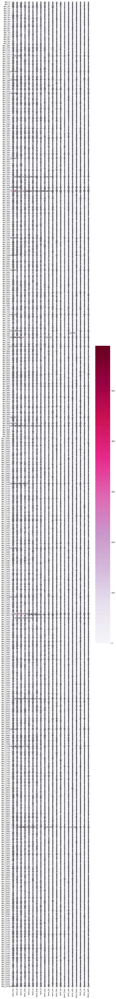

In [11]:
# Answer here
import seaborn as sns
# And then plot a sample of the 20 most frequent terms found in all the docs
plot_x = ["term_"+str(i) for i in count_vect.get_feature_names_out()[sorted_indices[::-1][0:20]]]
plot_y = ["doc_"+ str(i) for i in list(X.index)[0:]]
plot_z = X_counts[0:, sorted_indices[::-1][0:20]].toarray() #X_counts[how many documents, how many terms]
plt.subplots(figsize=(10, 100))
df_todraw = pd.DataFrame(plot_z, columns = plot_x, index = plot_y)
ax = sns.heatmap(df_todraw, cmap='PuRd', annot=True)

Showing the top 20 most frequent terms makes it less sparse and makes it way more meaningful 

### >>> Exercise 12 (take home):
Please try to reduce the dimension to 3, and plot the result use 3-D plot. Use at least 3 different angle (camera position) to check your result and describe what you found.

$Hint$: you can refer to Axes3D in the documentation.

(2257, 35788)
(2257, 3)


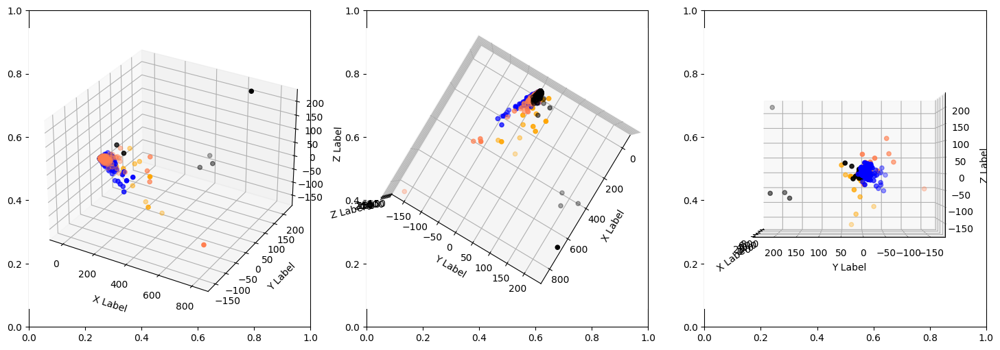

In [12]:
# Answer here
from sklearn.decomposition import PCA
col = ['coral', 'blue', 'black', 'orange']
print(X_counts.shape)
X_reduced = PCA(n_components = 3).fit_transform(X_counts.toarray())
print(X_reduced.shape)

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
ax1 = fig.add_subplot(131, projection='3d')
ax2 = fig.add_subplot(132, projection='3d')
ax3 = fig.add_subplot(133, projection='3d')

for c, category in zip(col, categories):
    xs = X_reduced[X['category_name'] == category].T[0]
    ys = X_reduced[X['category_name'] == category].T[1]
    zs = X_reduced[X['category_name'] == category].T[2]

    ax1.scatter(xs, ys, zs, c=c, marker='o')
    ax2.scatter(xs, ys, zs, c=c, marker='o')  
    ax3.scatter(xs, ys, zs, c=c, marker='o')

ax1.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
ax2.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
ax3.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
ax1.set_xlabel('\nX Label')
ax1.set_ylabel('\nY Label')
ax1.set_zlabel('\nZ Label')
ax2.set_xlabel('\nX Label')
ax2.set_ylabel('\nY Label')
ax2.set_zlabel('\nZ Label')
ax2.view_init(elev=90, azim=30)
ax3.set_xlabel('\nX Label')
ax3.set_ylabel('\nY Label')
ax3.set_zlabel('\nZ Label')
ax3.view_init(elev=0, azim=180)

plt.show()


I found out that the points are mostly scattered around 0 across all three axes

### >>> **Exercise 13 (take home):**
If you want a nicer interactive visualization here, I would encourage you try to install and use plotly to achieve this.

In [13]:
# # Answer here
import plotly.express as px

fig = px.bar(x=count_vect.get_feature_names_out()[:300], y=term_frequencies[:300])
fig.show()

### >>> **Exercise 14 (take home):** 
The chart above only contains 300 vocabulary in the documents, and it's already computationally intensive to both compute and visualize. Can you efficiently reduce the number of terms you want to visualize as an exercise. 


In [14]:
#Answer here
fig = px.bar(x=count_vect.get_feature_names_out()[:150], y=term_frequencies[:150])
fig.show()

### >>> **Exercise 15 (take home):** 
Additionally, you can attempt to sort the terms on the `x-axis` by frequency instead of in alphabetical order. This way the visualization is more meaninfgul and you will be able to observe the so called [long tail](https://en.wikipedia.org/wiki/Long_tail) (get familiar with this term since it will appear a lot in data mining and other statistics courses). see picture below

![alt txt](https://upload.wikimedia.org/wikipedia/commons/thumb/8/8a/Long_tail.svg/1000px-Long_tail.svg.png)

In [15]:
# # Answer here
index = np.argsort(term_frequencies)

# # Sort the term frequencies in descending order
sorted_term_frequencies = term_frequencies[index][::-1]
xlabel = count_vect.get_feature_names_out()[index][::-1]
import plotly.express as px

fig = px.bar(x=xlabel[:300], y=sorted_term_frequencies[:300])
fig.show()

### >>> **Exercise 16 (take home):**
Try to generate the binarization using the `category_name` column instead. Does it work?

In [16]:
# Answer here
from sklearn import preprocessing, metrics, decomposition, pipeline, dummy
mlb = preprocessing.LabelBinarizer()
mlb.fit(X.category_name)
X['bin_category_name'] = mlb.transform(X['category_name']).tolist()
X[0:9]
#It works and the results are the same as the previous one.

,text,category,category_name,bin_category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics,"[0, 1, 0, 0]"
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics,"[0, 1, 0, 0]"
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian,"[0, 0, 0, 1]"
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian,"[0, 0, 0, 1]"
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian,"[0, 0, 0, 1]"
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,3,soc.religion.christian,"[0, 0, 0, 1]"
6,From: jodfishe@silver.ucs.indiana.edu (joseph ...,3,soc.religion.christian,"[0, 0, 0, 1]"
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,2,sci.med,"[0, 0, 1, 0]"
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med,"[0, 0, 1, 0]"


# Part 2. Use The New Dataset

## 1. Data Preparation

Here I change the data from .txt into array object

In [17]:
text=[]
score=[]
#open text file
f = open('sentiment_labelled_combined.txt', 'r')
dataset = f.read()
f.close()
#split text file
dataset = dataset.split("\n")
dataset.pop()
#split entries
for i in dataset:
    x = []
    x = i.split("\t")
    text.append(x[0])
    score.append(x[-1])


## 2. Data Transformation

Create dataframe

In [18]:
import pandas as pd
# my functions
import helpers.data_mining_helpers as dmh

# construct dataframe from a list
X = pd.DataFrame.from_records(dmh.format_rows(text), columns= ['text'])
X

,text
0,So there is no way for me to plug it in here i...
1,"Good case, Excellent value."
2,Great for the jawbone.
3,Tied to charger for conversations lasting more...
4,The mic is great.
...,...
2995,I think food should have flavor and texture an...
2996,Appetite instantly gone.
2997,Overall I was not impressed and would not go b...
2998,"The whole experience was underwhelming, and I ..."


In [19]:
#add the score column
X['score']=score

In [20]:
#check the contents of the dataframe
X

,text,score
0,So there is no way for me to plug it in here i...,0
1,"Good case, Excellent value.",1
2,Great for the jawbone.,1
3,Tied to charger for conversations lasting more...,0
4,The mic is great.,1
...,...,...
2995,I think food should have flavor and texture an...,0
2996,Appetite instantly gone.,0
2997,Overall I was not impressed and would not go b...,0
2998,"The whole experience was underwhelming, and I ...",0


In [21]:
#check content of score column
print(X.score)

0       0
1       1
2       1
3       0
4       1
       ..
2995    0
2996    0
2997    0
2998    0
2999    0
Name: score, Length: 3000, dtype: object


In [22]:
X[X['score'] == '1'].iloc[::10][:5]
#fetch records belonging to the good score category, and query every 10th record. Only show the first 5 records.

,text,score
1,"Good case, Excellent value.",1
21,I bought this to use with my Kindle Fire and a...,1
44,Excellent bluetooth headset.,1
61,I really recommend this faceplates since it lo...,1
78,"I love this phone , It is very handy and has a...",1


## 3. Data Mining using Pandas

### 3.1 Check Missing Data

In [23]:
# check missing values
X.isnull()

,text,score
0,False,False
1,False,False
2,False,False
3,False,False
4,False,False
...,...,...
2995,False,False
2996,False,False
2997,False,False
2998,False,False


In [24]:
#check missing records using a slightly modified function in the helpers folder
X.isnull().apply(lambda x: dmh.check_missing_values(x))

,text,score
0,The amount of missing records is:,The amount of missing records is:
1,0,0


In [25]:
dummy_series = pd.Series(["dummy_record"], index=["text"])
dummy_series
dummy_series.to_frame().T
# .to_frame() -> Convert Series to DataFrame
# .T          -> Transpose
result_with_series = pd.concat([X, dummy_series.to_frame().T], ignore_index=True)
# check if the records was commited into result
len(result_with_series)
result_with_series.isnull().apply(lambda x: dmh.check_missing_values(x))
X.isnull().apply(lambda x: dmh.check_missing_values(x))
len(X)

3000

### 3.2 Check Duplicate Data

In [26]:
#check duplicates
print(X.duplicated())

0       False
1       False
2       False
3       False
4       False
        ...  
2995    False
2996    False
2997    False
2998    False
2999    False
Length: 3000, dtype: bool


In [27]:
#check the amount of duplicates
sum(X.duplicated('text'))

17

In [28]:
X.drop_duplicates(keep='first', inplace=True) 
# first means keep the first record, inplace applies changes directly on our dataframe

In [29]:
#check the amount of duplicates
sum(X.duplicated())

0

In [30]:
#check the current length of the dataset, since we dropped 17, so 3000-17=2983
len(X)

2983

## 4. Data Preprocessing

### 4.1 Sampling

In [31]:
#create sample
print(X.shape)
X_sample = X.sample(n=1000,random_state=42) #random state
display(X_sample)
len(X_sample)

(2983, 2)


,text,score
2423,We've tried to like this place but after 10+ t...,0
1558,The script is a big flawed mess.,0
889,It was that loud.Glad to say that the Plantron...,1
332,The reception is excellent!,1
1850,Now imagine that every single one of those dec...,0
...,...,...
926,It looses connection to the phone even when it...,0
1221,There are the usual Hitchcock logic flaws.,0
2724,Awesome selection of beer.,1
2470,"Very good, though!",1


1000

In [32]:
#check first four records
X_sample[0:4]

,text,score
2423,We've tried to like this place but after 10+ t...,0
1558,The script is a big flawed mess.,0
889,It was that loud.Glad to say that the Plantron...,1
332,The reception is excellent!,1


In [33]:
import matplotlib.pyplot as plt
%matplotlib inline

score
0    1493
1    1490
Name: count, dtype: int64


<AxesSubplot:title={'center':'Score Distribution'}, xlabel='score'>

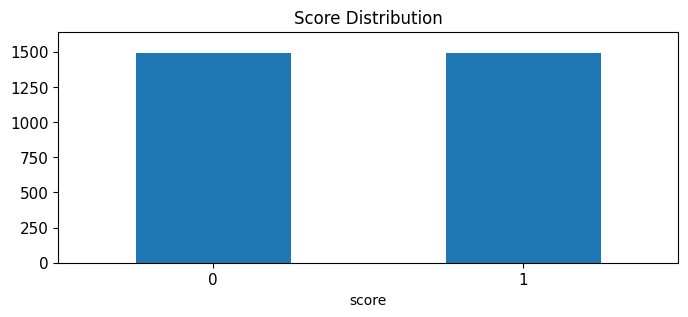

In [34]:
#create bar graph for score distribution of X
print(X.score.value_counts())
upper_bound = max(X.score.value_counts() + X.score.value_counts()/10)
# plot barchart for X
X.score.value_counts().plot(kind = 'bar',
                                    title = 'Score Distribution',
                                    ylim = [0, upper_bound],        
                                    rot = 0, fontsize = 11, figsize = (8,3))

score
0    506
1    494
Name: count, dtype: int64


<AxesSubplot:title={'center':'Score Distribution'}, xlabel='score'>

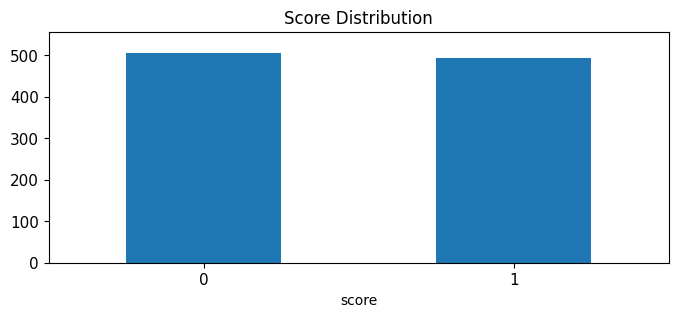

In [35]:
#create bar graph for score distribution of X
print(X_sample.score.value_counts())
upper_bound = max(X_sample.score.value_counts() + X_sample.score.value_counts()/10)
# plot barchart for X_sample
X_sample.score.value_counts().plot(kind = 'bar',
                                    title = 'Score Distribution',
                                    ylim = [0, upper_bound],        
                                    rot = 0, fontsize = 11, figsize = (8,3))

score
0    1493
1    1490
Name: count, dtype: int64
score
0    506
1    494
Name: count, dtype: int64


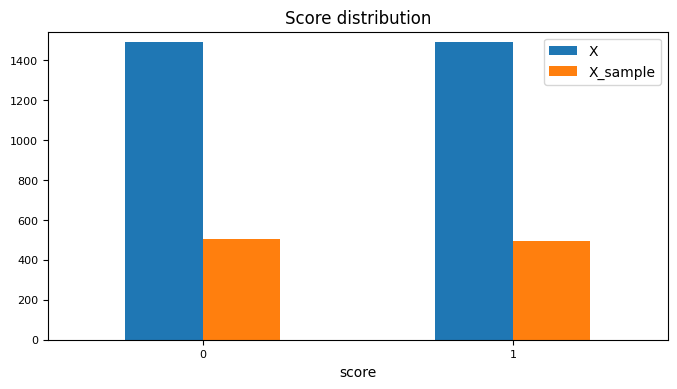

In [36]:
#Answer here
# create bar graph for score distribution of X and X_sample side by side
print(X.score.value_counts())
print(X_sample.score.value_counts())

# Sort X_sample_value_counts based on the values in X_value_counts
X_sample_value_counts_sorted = X_sample.score.value_counts().reindex(index=X.score.value_counts().index)

# Combine the value counts into a single DataFrame
X_combined = pd.DataFrame({'X': X.score.value_counts(), 'X_sample': X_sample_value_counts_sorted})

# Calculate upper_bound as the maximum of X and X_sample
upper_bound = max(X_combined[['X', 'X_sample']].values.flatten()) + 50

# Create the bar plot
X_combined.plot(kind='bar',
                title='Score distribution',
                ylim=[0, upper_bound],
                rot=0, fontsize=8, figsize=(8, 4))

plt.show()

### 4.2. Feature Creation

In [37]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to C:\Users\Jansen
[nltk_data]     Christopher\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [38]:
'''
LookupError: 
**********************************************************************
  Resource punkt not found.
  Please use the NLTK Downloader to obtain the resource:

  >>> import nltk
  >>> nltk.download('punkt')
'''
# create unigrams and check first four records
# takes a like a minute or two to process
X['unigrams'] = X['text'].apply(lambda x: dmh.tokenize_text(x))
X[0:4]["unigrams"]

0    [So, there, is, no, way, for, me, to, plug, it...
1                 [Good, case, ,, Excellent, value, .]
2                        [Great, for, the, jawbone, .]
3    [Tied, to, charger, for, conversations, lastin...
Name: unigrams, dtype: object

In [39]:
#check the updated first four records of the dataset
X[0:4]

,text,score,unigrams
0,So there is no way for me to plug it in here i...,0,"[So, there, is, no, way, for, me, to, plug, it..."
1,"Good case, Excellent value.",1,"[Good, case, ,, Excellent, value, .]"
2,Great for the jawbone.,1,"[Great, for, the, jawbone, .]"
3,Tied to charger for conversations lasting more...,0,"[Tied, to, charger, for, conversations, lastin..."


In [40]:
list(X[0:1]['unigrams'])

[['So',
  'there',
  'is',
  'no',
  'way',
  'for',
  'me',
  'to',
  'plug',
  'it',
  'in',
  'here',
  'in',
  'the',
  'US',
  'unless',
  'I',
  'go',
  'by',
  'a',
  'converter',
  '.']]

### 4.3 Feature subset selection

In [41]:
from sklearn.feature_extraction.text import CountVectorizer

count_vect = CountVectorizer()
X_counts = count_vect.fit_transform(X.text) #learn the vocabulary and return document-term matrix
print(X_counts.shape)
print(X_counts[0])

(2983, 5159)
  (0, 4165)	1
  (0, 4549)	1
  (0, 2428)	1
  (0, 3045)	1
  (0, 4991)	1
  (0, 1830)	1
  (0, 2811)	1
  (0, 4613)	1
  (0, 3389)	1
  (0, 2434)	1
  (0, 2315)	2
  (0, 2159)	1
  (0, 4535)	1
  (0, 4839)	1
  (0, 4797)	1
  (0, 1983)	1
  (0, 648)	1
  (0, 1014)	1


In [42]:
#feature name of the 4887th term
count_vect.get_feature_names_out()[4887]

'verbal'

In [43]:
analyze = count_vect.build_analyzer()
analyze(X.text[0])

['so',
 'there',
 'is',
 'no',
 'way',
 'for',
 'me',
 'to',
 'plug',
 'it',
 'in',
 'here',
 'in',
 'the',
 'us',
 'unless',
 'go',
 'by',
 'converter']

In [44]:
analyze(" ".join(list(X[:1].text)))

['so',
 'there',
 'is',
 'no',
 'way',
 'for',
 'me',
 'to',
 'plug',
 'it',
 'in',
 'here',
 'in',
 'the',
 'us',
 'unless',
 'go',
 'by',
 'converter']

In [45]:
# We can obtain the feature names of the vectorizer, i.e., the terms
# usually on the horizontal axis
count_vect.get_feature_names_out()[0:10]

array(['00', '10', '100', '11', '12', '13', '15', '15g', '15pm', '17'],
      dtype=object)

In [46]:
# # Sort the term frequencies in descending order
term_frequencies = []
print(X_counts.shape[1])
for j in range(0,X_counts.shape[1]):
    term_frequencies.append(sum(X_counts[:,j].toarray()))
term_frequencies = np.asarray(X_counts.sum(axis=0))[0]
sorted_indices = np.argsort(term_frequencies)
sorted_term_frequencies = term_frequencies[sorted_indices][::-1]

5159


In [47]:
# first twenty features only
plot_x = ["term_"+str(i) for i in count_vect.get_feature_names_out()[sorted_indices[::-1][0:20]]]
print(plot_x)

['term_the', 'term_and', 'term_it', 'term_is', 'term_to', 'term_this', 'term_of', 'term_was', 'term_in', 'term_for', 'term_that', 'term_not', 'term_with', 'term_my', 'term_very', 'term_good', 'term_on', 'term_you', 'term_great', 'term_but']


In [48]:
# obtain document index
plot_y = ["doc_"+ str(i) for i in list(X.index)[0:]]
print(plot_y)

['doc_0', 'doc_1', 'doc_2', 'doc_3', 'doc_4', 'doc_5', 'doc_6', 'doc_7', 'doc_8', 'doc_9', 'doc_10', 'doc_11', 'doc_12', 'doc_13', 'doc_14', 'doc_15', 'doc_16', 'doc_17', 'doc_18', 'doc_19', 'doc_20', 'doc_21', 'doc_22', 'doc_23', 'doc_24', 'doc_25', 'doc_26', 'doc_27', 'doc_28', 'doc_29', 'doc_30', 'doc_31', 'doc_32', 'doc_33', 'doc_34', 'doc_35', 'doc_36', 'doc_37', 'doc_38', 'doc_39', 'doc_40', 'doc_41', 'doc_42', 'doc_43', 'doc_44', 'doc_45', 'doc_46', 'doc_47', 'doc_48', 'doc_49', 'doc_50', 'doc_51', 'doc_52', 'doc_53', 'doc_54', 'doc_55', 'doc_56', 'doc_57', 'doc_58', 'doc_59', 'doc_60', 'doc_61', 'doc_62', 'doc_63', 'doc_64', 'doc_65', 'doc_66', 'doc_67', 'doc_68', 'doc_69', 'doc_70', 'doc_71', 'doc_72', 'doc_73', 'doc_74', 'doc_75', 'doc_76', 'doc_77', 'doc_78', 'doc_79', 'doc_80', 'doc_81', 'doc_82', 'doc_83', 'doc_84', 'doc_85', 'doc_86', 'doc_87', 'doc_88', 'doc_89', 'doc_90', 'doc_91', 'doc_92', 'doc_93', 'doc_94', 'doc_95', 'doc_96', 'doc_97', 'doc_98', 'doc_99', 'doc_100'

In [49]:
plot_z = X_counts[0:, sorted_indices[::-1][0:20]].toarray() #X_counts[how many documents, how many terms]
print(plot_z)

[[1 0 1 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [1 0 0 ... 0 1 0]
 ...
 [0 1 0 ... 0 0 0]
 [1 1 0 ... 0 0 0]
 [3 0 1 ... 0 0 0]]


In [50]:
import seaborn as sns

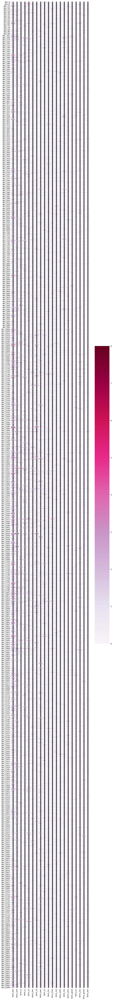

In [51]:
# Answer here
# And then plot a sample of the 20 most frequent terms found in all the docs
plt.subplots(figsize=(10, 100))
df_todraw = pd.DataFrame(plot_z, columns = plot_x, index = plot_y)
ax = sns.heatmap(df_todraw, cmap='PuRd', annot=True)

Showing the top 20 most frequent terms makes it less sparse and makes it way more meaningful 

### 4.4 Dimensionality Reduction

In [52]:
# reduce dimension to 2
from sklearn.decomposition import PCA
print(X_counts.shape)
X_reduced = PCA(n_components = 2).fit_transform(X_counts.toarray())
print(X_reduced.shape)

(2983, 5159)
(2983, 2)


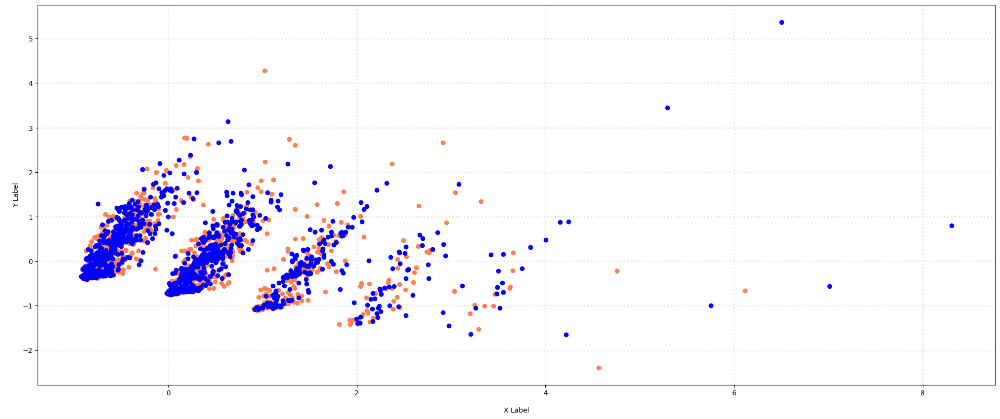

In [53]:
# plot the after reduction
col = ['coral', 'blue']
scores = ['0','1']
# plot
fig = plt.figure(figsize = (25,10))
ax = fig.subplots()

for c, score in zip(col, scores):
    xs = X_reduced[X['score'] == score].T[0]
    ys = X_reduced[X['score'] == score].T[1]
   
    ax.scatter(xs, ys, c = c, marker='o')

ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
ax.set_xlabel('\nX Label')
ax.set_ylabel('\nY Label')

plt.show()


(2983, 5159)
(2983, 3)


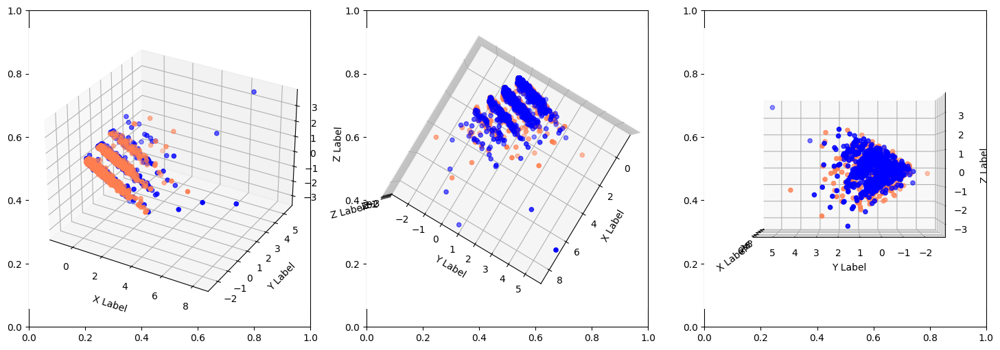

In [54]:
# reduce to 3 dimension and then plot it from 3 different angles
# Answer here
col = ['coral', 'blue']
print(X_counts.shape)
X_reduced = PCA(n_components = 3).fit_transform(X_counts.toarray())
print(X_reduced.shape)


fig, axes = plt.subplots(1, 3, figsize=(18, 6))
ax1 = fig.add_subplot(131, projection='3d')
ax2 = fig.add_subplot(132, projection='3d')
ax3 = fig.add_subplot(133, projection='3d')

for c, score in zip(col, scores):
    xs = X_reduced[X['score'] == score].T[0]
    ys = X_reduced[X['score'] == score].T[1]
    zs = X_reduced[X['score'] == score].T[2]

    ax1.scatter(xs, ys, zs, c=c, marker='o')
    ax2.scatter(xs, ys, zs, c=c, marker='o')  
    ax3.scatter(xs, ys, zs, c=c, marker='o')

ax1.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
ax2.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
ax3.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
ax1.set_xlabel('\nX Label')
ax1.set_ylabel('\nY Label')
ax1.set_zlabel('\nZ Label')
ax2.set_xlabel('\nX Label')
ax2.set_ylabel('\nY Label')
ax2.set_zlabel('\nZ Label')
ax2.view_init(elev=90, azim=30)
ax3.set_xlabel('\nX Label')
ax3.set_ylabel('\nY Label')
ax3.set_zlabel('\nZ Label')
ax3.view_init(elev=0, azim=180)

plt.show()


We can see that the points are scattered around 0 in the z-axis, mostly in the positive for the y-axis, and mostly in the positive for x-axis as well. We can see that most of it are flocked around the same location

### 4.5 Attribute Transformation / Aggregation

In [55]:
import plotly.express as px

fig = px.bar(x=count_vect.get_feature_names_out()[:300], y=term_frequencies[:300])
fig.show()

In [56]:
#Answer here
#reduce to 150 terms
fig = px.bar(x=count_vect.get_feature_names_out()[:150], y=term_frequencies[:150])
fig.show()

In [57]:
index = np.argsort(term_frequencies)

# Sort the term frequencies in descending order
sorted_term_frequencies = term_frequencies[index][::-1]
xlabel = count_vect.get_feature_names_out()[sorted_indices][::-1]

fig = px.bar(x=xlabel[:300], y=sorted_term_frequencies[:300])
fig.show()

In [58]:
import math
term_frequencies_log = [math.log(i) for i in term_frequencies]

C:\Users\Jansen Christopher\AppData\Local\Temp\ipykernel_18324\1516414146.py:4: UserWarning:

FixedFormatter should only be used together with FixedLocator



[Text(0, 0, '00'),
 Text(1, 0, '10'),
 Text(2, 0, '100'),
 Text(3, 0, '11'),
 Text(4, 0, '12'),
 Text(5, 0, '13'),
 Text(6, 0, '15'),
 Text(7, 0, '15g'),
 Text(8, 0, '15pm'),
 Text(9, 0, '17'),
 Text(10, 0, '18'),
 Text(11, 0, '18th'),
 Text(12, 0, '1928'),
 Text(13, 0, '1947'),
 Text(14, 0, '1948'),
 Text(15, 0, '1949'),
 Text(16, 0, '1971'),
 Text(17, 0, '1973'),
 Text(18, 0, '1979'),
 Text(19, 0, '1980'),
 Text(20, 0, '1986'),
 Text(21, 0, '1995'),
 Text(22, 0, '1998'),
 Text(23, 0, '20'),
 Text(24, 0, '2000'),
 Text(25, 0, '2005'),
 Text(26, 0, '2006'),
 Text(27, 0, '2007'),
 Text(28, 0, '20th'),
 Text(29, 0, '2160'),
 Text(30, 0, '23'),
 Text(31, 0, '24'),
 Text(32, 0, '25'),
 Text(33, 0, '2mp'),
 Text(34, 0, '30'),
 Text(35, 0, '30s'),
 Text(36, 0, '325'),
 Text(37, 0, '35'),
 Text(38, 0, '350'),
 Text(39, 0, '375'),
 Text(40, 0, '3o'),
 Text(41, 0, '40'),
 Text(42, 0, '40min'),
 Text(43, 0, '42'),
 Text(44, 0, '44'),
 Text(45, 0, '45'),
 Text(46, 0, '4s'),
 Text(47, 0, '4ths'),


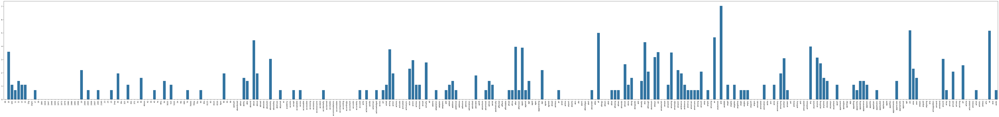

In [59]:
plt.subplots(figsize=(100, 10))
g = sns.barplot(x=count_vect.get_feature_names_out()[:300],
                y=term_frequencies_log[:300])
g.set_xticklabels(count_vect.get_feature_names_out()[:300], rotation = 90)

### 4.6 Discretization and Binarization

In [60]:
from sklearn import preprocessing, metrics, decomposition, pipeline, dummy
mlb = preprocessing.LabelBinarizer()
mlb.fit(X.score)
X['bin_score'] = mlb.transform(X['score']).tolist()

In [61]:
X[0:9]

,text,score,unigrams,bin_score
0,So there is no way for me to plug it in here i...,0,"[So, there, is, no, way, for, me, to, plug, it...",[0]
1,"Good case, Excellent value.",1,"[Good, case, ,, Excellent, value, .]",[1]
2,Great for the jawbone.,1,"[Great, for, the, jawbone, .]",[1]
3,Tied to charger for conversations lasting more...,0,"[Tied, to, charger, for, conversations, lastin...",[0]
4,The mic is great.,1,"[The, mic, is, great, .]",[1]
5,I have to jiggle the plug to get it to line up...,0,"[I, have, to, jiggle, the, plug, to, get, it, ...",[0]
6,If you have several dozen or several hundred c...,0,"[If, you, have, several, dozen, or, several, h...",[0]
7,If you are Razr owner...you must have this!,1,"[If, you, are, Razr, owner, ..., you, must, ha...",[1]
8,"Needless to say, I wasted my money.",0,"[Needless, to, say, ,, I, wasted, my, money, .]",[0]


## 5. Data Exploration

In [62]:
# We retrieve 3 sentences for a random record
document_to_transform_1 = []
random_record_1 = X.iloc[50]
random_record_1 = random_record_1['text']
document_to_transform_1.append(random_record_1)

document_to_transform_2 = []
random_record_2 = X.iloc[100]
random_record_2 = random_record_2['text']
document_to_transform_2.append(random_record_2)

document_to_transform_3 = []
random_record_3 = X.iloc[150]
random_record_3 = random_record_3['text']
document_to_transform_3.append(random_record_3)

In [63]:
print(document_to_transform_1)
print(document_to_transform_2)
print(document_to_transform_3)

["Not loud enough and doesn't turn on like it should."]
['Integrated seamlessly with the Motorola RAZR phone.']
['I Was Hoping for More.']


In [64]:
from sklearn.preprocessing import binarize

# Transform sentence with Vectorizers
document_vector_count_1 = count_vect.transform(document_to_transform_1)
document_vector_count_2 = count_vect.transform(document_to_transform_2)
document_vector_count_3 = count_vect.transform(document_to_transform_3)

# Binarize vectors to simplify: 0 for abscence, 1 for prescence
document_vector_count_1_bin = binarize(document_vector_count_1)
document_vector_count_2_bin = binarize(document_vector_count_2)
document_vector_count_3_bin = binarize(document_vector_count_3)

# print vectors
print("Let's take a look at the count vectors:")
print(document_vector_count_1.todense())
print(document_vector_count_2.todense())
print(document_vector_count_3.todense())

Let's take a look at the count vectors:
[[0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]]


In [65]:
from sklearn.metrics.pairwise import cosine_similarity

# Calculate Cosine Similarity
cos_sim_count_1_2 = cosine_similarity(document_vector_count_1, document_vector_count_2, dense_output=True)
cos_sim_count_1_3 = cosine_similarity(document_vector_count_1, document_vector_count_3, dense_output=True)
cos_sim_count_2_3 = cosine_similarity(document_vector_count_2, document_vector_count_3, dense_output=True)

cos_sim_count_1_1 = cosine_similarity(document_vector_count_1, document_vector_count_1, dense_output=True)
cos_sim_count_2_2 = cosine_similarity(document_vector_count_2, document_vector_count_2, dense_output=True)
cos_sim_count_3_3 = cosine_similarity(document_vector_count_3, document_vector_count_3, dense_output=True)

# Print 
print("Cosine Similarity using count bw 1 and 2: %(x)f" %{"x":cos_sim_count_1_2})
print("Cosine Similarity using count bw 1 and 3: %(x)f" %{"x":cos_sim_count_1_3})
print("Cosine Similarity using count bw 2 and 3: %(x)f" %{"x":cos_sim_count_2_3})

print("Cosine Similarity using count bw 1 and 1: %(x)f" %{"x":cos_sim_count_1_1})
print("Cosine Similarity using count bw 2 and 2: %(x)f" %{"x":cos_sim_count_2_2})
print("Cosine Similarity using count bw 3 and 3: %(x)f" %{"x":cos_sim_count_3_3})

Cosine Similarity using count bw 1 and 2: 0.000000
Cosine Similarity using count bw 1 and 3: 0.000000
Cosine Similarity using count bw 2 and 3: 0.000000
Cosine Similarity using count bw 1 and 1: 1.000000
Cosine Similarity using count bw 2 and 2: 1.000000
Cosine Similarity using count bw 3 and 3: 1.000000


# Part 3. Generate New Meaningful Visualizations
## Make a Pie Chart of the Scores

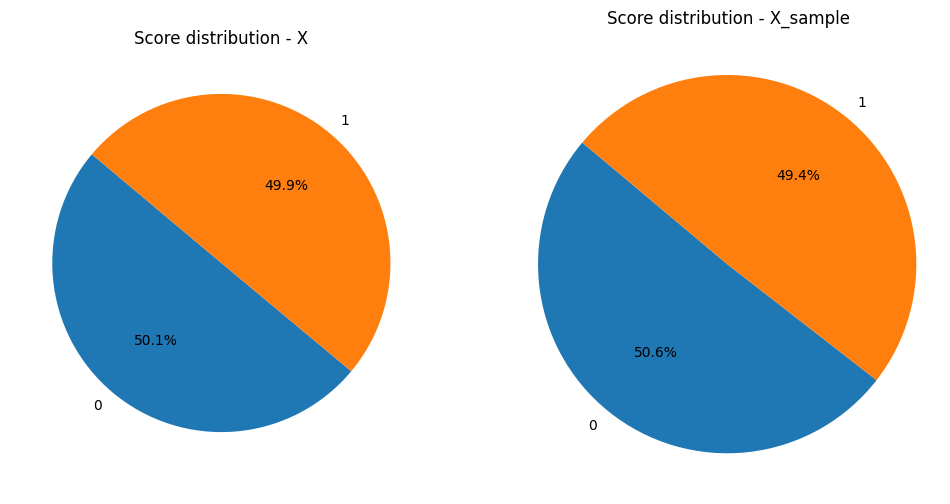

In [66]:
import numpy as np
import matplotlib.pyplot as plt

blue_bar = X['score'].value_counts()
orange_bar = X_sample['score'].value_counts()

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Create a pie chart for X
ax1.pie(blue_bar, labels=blue_bar.index, autopct='%1.1f%%', startangle=140)
ax1.set_title('Score distribution - X')

# Create a pie chart for X_sample
ax2.pie(orange_bar, labels=orange_bar.index, autopct='%1.1f%%', startangle=140)
ax2.set_title('Score distribution - X_sample')

plt.axis('equal')  # Equal aspect ratio ensures that pies are drawn as circles.

plt.show()


We can see the score distribution better because you can see the percentages of the good reviews and bad reviews for both X and X_sample

Another possibility is to check term frequencies for good reviews and bad reviews so that we might be able to know what words are the most frequent in good and bad reviews 

In [73]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
count_vect_good = CountVectorizer()
count_vect_bad = CountVectorizer()
# Create a DataFrame for good scores (score=1)
good_reviews=[]
bad_reviews=[]

for i,j in zip(X.score, X.text):
    if i == '1':
        good_reviews.append(j)
    else:
        bad_reviews.append(j)


# Fit and transform the vectorizer on the good reviews
good_term_counts = count_vect_good.fit_transform(good_reviews)
good_term_frequencies = []
for j in range(0,good_term_counts.shape[1]):
    good_term_frequencies.append(sum(good_term_counts[:,j].toarray()))
good_term_frequencies = np.asarray(good_term_counts.sum(axis=0))[0]
good_sorted_indices = np.argsort(good_term_frequencies)
good_sorted_term_frequencies = good_term_frequencies[good_sorted_indices][::-1]
# Fit and transform the vectorizer on the bad reviews
bad_term_counts = count_vect_bad.fit_transform(bad_reviews)
bad_term_frequencies = []
for j in range(0,bad_term_counts.shape[1]):
    bad_term_frequencies.append(sum(bad_term_counts[:,j].toarray()))
bad_term_frequencies = np.asarray(bad_term_counts.sum(axis=0))[0]
bad_sorted_indices = np.argsort(bad_term_frequencies)
bad_sorted_term_frequencies = bad_term_frequencies[bad_sorted_indices][::-1]

# Sort the term frequencies in descending order
good_xlabel = count_vect_good.get_feature_names_out()[good_sorted_indices][::-1]
bad_xlabel = count_vect_bad.get_feature_names_out()[bad_sorted_indices][::-1]
fig1 = px.bar(x=good_xlabel[:100], y=good_sorted_term_frequencies[:100], title = "Good Reviews Term Frequencies")
fig2 = px.bar(x=bad_xlabel[:100], y=bad_sorted_term_frequencies[:100], title = "Bad Reviews Term Frequencies")
fig1.show()
fig2.show()
# Get the feature names (terms)

# Convert term frequencies to DataFrames for good and bad reviews
# good_term_freq_df = pd.DataFrame(good_term_frequencies.toarray(), columns=terms)
# bad_term_freq_df = pd.DataFrame(bad_term_frequencies.toarray(), columns=terms)


From the two plots above we can see the differences in the term frequencies, and we are able to tell which words are used in which kind of reviews.

# Part 4. Generate TF-IDF Features

In [74]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer()
X_tfidf = vectorizer.fit_transform(X.text)
print(X_tfidf.shape)
print(X_tfidf[0])

(2983, 5159)
  (0, 1014)	0.39845191493787
  (0, 648)	0.22336356134689328
  (0, 1983)	0.23148898512916666
  (0, 4797)	0.33196418005888045
  (0, 4839)	0.27543498748014605
  (0, 4535)	0.08660911076870992
  (0, 2159)	0.2227447042096017
  (0, 2315)	0.29538473002682736
  (0, 2434)	0.11967341692510161
  (0, 3389)	0.30867885491964087
  (0, 4613)	0.12743843831122717
  (0, 2811)	0.22862480508531938
  (0, 1830)	0.15641093659829974
  (0, 4991)	0.24912534604580203
  (0, 3045)	0.22336356134689328
  (0, 2428)	0.12076100916837491
  (0, 4549)	0.20758334753371457
  (0, 4165)	0.18739563776922355


In [75]:
#feature names. should be similar to the one we did earlier
vectorizer.get_feature_names_out()

array(['00', '10', '100', ..., 'zillion', 'zombie', 'zombiez'],
      dtype=object)

In [76]:
#analyze
tfidf_analyze = vectorizer.build_analyzer()
tfidf_analyze(X.text[0])

['so',
 'there',
 'is',
 'no',
 'way',
 'for',
 'me',
 'to',
 'plug',
 'it',
 'in',
 'here',
 'in',
 'the',
 'us',
 'unless',
 'go',
 'by',
 'converter']

In [77]:
tfidf_analyze(" ".join(list(X[:1].text)))

['so',
 'there',
 'is',
 'no',
 'way',
 'for',
 'me',
 'to',
 'plug',
 'it',
 'in',
 'here',
 'in',
 'the',
 'us',
 'unless',
 'go',
 'by',
 'converter']

In [78]:
# Answer here
X_counts_array_tfidf = X_tfidf[0:5, 0:100].toarray()
count=0
for i in X_counts_array_tfidf[3]:
    if i==1:
        print(vectorizer.get_feature_names_out()[count])
    count+=1


In [79]:
# first twenty features only
plot_x = ["term_"+str(i) for i in vectorizer.get_feature_names_out()[0:50]]
print(plot_x)

['term_00', 'term_10', 'term_100', 'term_11', 'term_12', 'term_13', 'term_15', 'term_15g', 'term_15pm', 'term_17', 'term_18', 'term_18th', 'term_1928', 'term_1947', 'term_1948', 'term_1949', 'term_1971', 'term_1973', 'term_1979', 'term_1980', 'term_1986', 'term_1995', 'term_1998', 'term_20', 'term_2000', 'term_2005', 'term_2006', 'term_2007', 'term_20th', 'term_2160', 'term_23', 'term_24', 'term_25', 'term_2mp', 'term_30', 'term_30s', 'term_325', 'term_35', 'term_350', 'term_375', 'term_3o', 'term_40', 'term_40min', 'term_42', 'term_44', 'term_45', 'term_4s', 'term_4ths', 'term_50', 'term_5020']


In [80]:
# obtain document index
plot_y = ["doc_"+ str(i) for i in list(X.index)[0:50]]
print(plot_y)

['doc_0', 'doc_1', 'doc_2', 'doc_3', 'doc_4', 'doc_5', 'doc_6', 'doc_7', 'doc_8', 'doc_9', 'doc_10', 'doc_11', 'doc_12', 'doc_13', 'doc_14', 'doc_15', 'doc_16', 'doc_17', 'doc_18', 'doc_19', 'doc_20', 'doc_21', 'doc_22', 'doc_23', 'doc_24', 'doc_25', 'doc_26', 'doc_27', 'doc_28', 'doc_29', 'doc_30', 'doc_31', 'doc_32', 'doc_33', 'doc_34', 'doc_35', 'doc_36', 'doc_37', 'doc_38', 'doc_39', 'doc_40', 'doc_41', 'doc_42', 'doc_43', 'doc_44', 'doc_45', 'doc_46', 'doc_47', 'doc_48', 'doc_49']


In [81]:
plot_z = X_tfidf[0:50, 0:50].toarray() #X_counts[how many documents, how many terms]
print(plot_z)

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


,term_00,term_10,term_100,term_11,term_12,term_13,term_15,term_15g,term_15pm,term_17,...,term_3o,term_40,term_40min,term_42,term_44,term_45,term_4s,term_4ths,term_50,term_5020
doc_0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
doc_1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
doc_2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
doc_3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.358602,0.0,0.0,0.0,0.0
doc_4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
doc_5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
doc_6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
doc_7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
doc_8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
doc_9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0


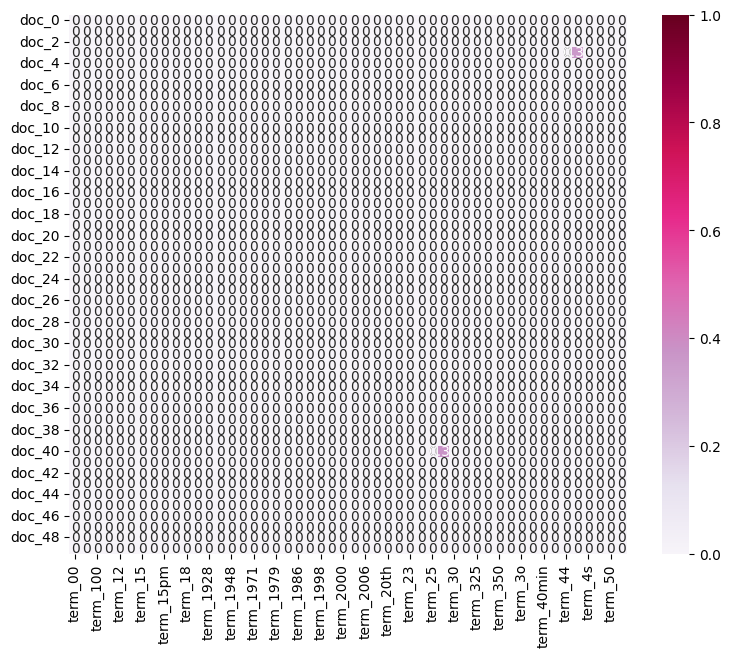

In [82]:
import seaborn as sns

df_todraw = pd.DataFrame(plot_z, columns = plot_x, index = plot_y)
display(df_todraw)
plt.subplots(figsize=(9, 7))
ax = sns.heatmap(df_todraw,
                 cmap="PuRd",
                 vmin=0, vmax=1, annot=True)

In [83]:
from sklearn.decomposition import PCA
print(X_tfidf.shape)
X_reduced = PCA(n_components = 2).fit_transform(X_tfidf.toarray())
print(X_reduced.shape)

(2983, 5159)
(2983, 2)


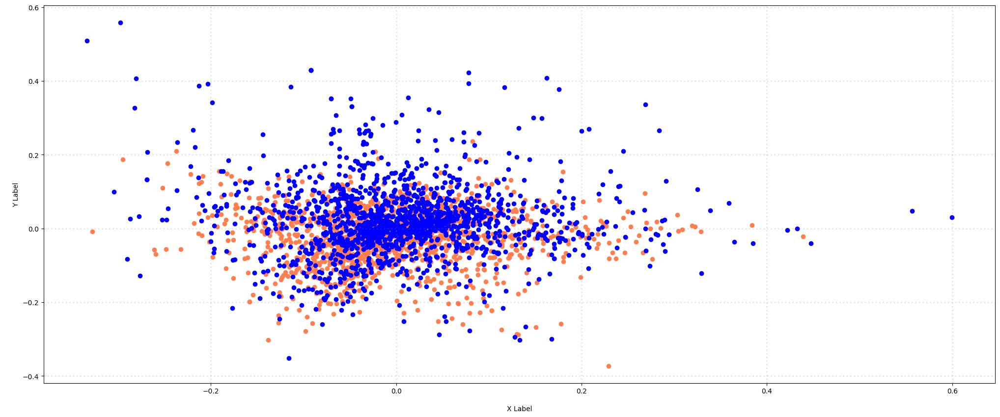

In [84]:
col = ['coral', 'blue']
scores = ['0','1']
# plot
fig = plt.figure(figsize = (25,10))
ax = fig.subplots()

for c, score in zip(col, scores):
    xs = X_reduced[X['score'] == score].T[0]
    ys = X_reduced[X['score'] == score].T[1]
   
    ax.scatter(xs, ys, c = c, marker='o')

ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
ax.set_xlabel('\nX Label')
ax.set_ylabel('\nY Label')

plt.show()


(2983, 5159)
(2983, 3)


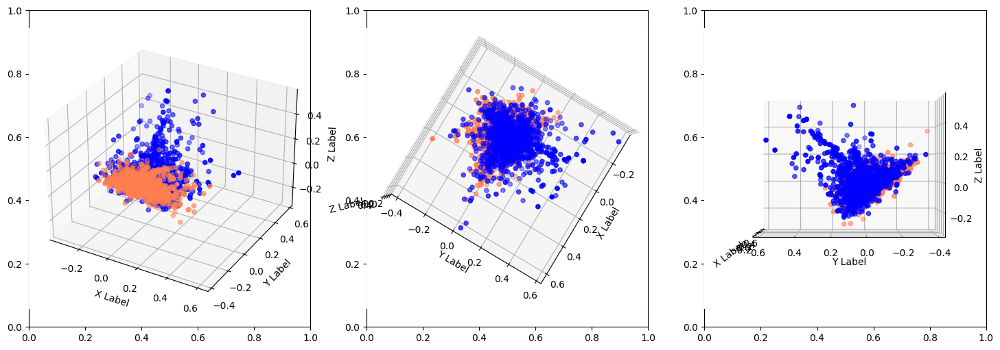

In [85]:
# Answer here
col = ['coral', 'blue']
print(X_tfidf.shape)
X_reduced = PCA(n_components = 3).fit_transform(X_tfidf.toarray())
print(X_reduced.shape)


fig, axes = plt.subplots(1, 3, figsize=(18, 6))

ax1 = fig.add_subplot(131, projection='3d')
ax2 = fig.add_subplot(132, projection='3d')
ax3 = fig.add_subplot(133, projection='3d')

for c, score in zip(col, scores):
    xs = X_reduced[X['score'] == score].T[0]
    ys = X_reduced[X['score'] == score].T[1]
    zs = X_reduced[X['score'] == score].T[2]

    ax1.scatter(xs, ys, zs, c=c, marker='o')
    ax2.scatter(xs, ys, zs, c=c, marker='o')
    ax3.scatter(xs, ys, zs, c=c, marker='o')

ax1.set_xlabel('X Label')
ax1.set_ylabel('Y Label')
ax1.set_zlabel('Z Label')
ax2.set_xlabel('X Label')
ax2.set_ylabel('Y Label')
ax2.set_zlabel('Z Label')
ax2.view_init(elev=90, azim=30)
ax3.set_xlabel('X Label')
ax3.set_ylabel('Y Label')
ax3.set_zlabel('Z Label')
ax3.view_init(elev=0, azim=180)

plt.show()


# Part 5. Implement a simple Naive Bayes classifier

In [86]:
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB

# first, split our data into train and test splits
X_train, X_test, Y_train, Y_test = train_test_split(X['text'], X['score'], test_size=0.2, random_state=42)
# vectorize both train and test splits
X_train_vectorized = count_vect.fit_transform(X_train)
X_test_vectorized = count_vect.transform(X_test)
# fit the data to the naive bayes classifier using the train split
mnb = MultinomialNB()
mnb.fit(X_train_vectorized, Y_train)
# predict using test split and check the result. 0 means bad review and 1 means good review
Y_pred = mnb.predict(X_test_vectorized)
Y_pred

array(['0', '0', '0', '1', '1', '0', '0', '0', '0', '0', '1', '0', '0',
       '0', '1', '0', '1', '1', '1', '0', '0', '1', '1', '1', '0', '1',
       '0', '0', '0', '0', '1', '0', '0', '1', '0', '1', '0', '1', '0',
       '1', '1', '1', '1', '0', '0', '0', '0', '0', '0', '1', '0', '0',
       '1', '1', '0', '1', '1', '0', '0', '0', '1', '0', '1', '1', '1',
       '0', '1', '1', '1', '0', '0', '1', '0', '1', '0', '1', '1', '0',
       '0', '1', '1', '1', '0', '0', '0', '1', '1', '1', '1', '0', '1',
       '1', '0', '1', '0', '0', '1', '1', '0', '0', '1', '0', '1', '1',
       '1', '0', '1', '0', '1', '0', '0', '0', '1', '0', '1', '0', '0',
       '0', '1', '1', '0', '1', '1', '1', '0', '1', '1', '0', '1', '1',
       '0', '1', '1', '0', '1', '0', '1', '1', '0', '1', '0', '0', '1',
       '1', '1', '1', '0', '0', '0', '1', '1', '0', '0', '0', '1', '0',
       '0', '0', '0', '1', '0', '0', '1', '0', '0', '0', '1', '0', '1',
       '1', '0', '1', '0', '0', '1', '1', '0', '0', '1', '1', '0

In [87]:
# similarly, split our data into train and test splits
X_train_tfidf, X_test_tfidf, Y_train_tfidf, Y_test_tfidf = train_test_split(X['text'], X['score'], test_size=0.2, random_state=42)
# vectorize both train and test splits, using tfidf vectorizer this time around
X_train_vectorized_tfidf = vectorizer.fit_transform(X_train_tfidf)
X_test_vectorized_tfidf = vectorizer.transform(X_test_tfidf)
# fit the data to the naive bayes classifier using the train split
mnb = MultinomialNB()
mnb.fit(X_train_vectorized_tfidf, Y_train_tfidf)
# predict using test split and check the result. 0 means bad review and 1 means good review
Y_pred_tfidf = mnb.predict(X_test_vectorized_tfidf)
Y_pred_tfidf

array(['0', '0', '0', '1', '1', '0', '0', '0', '0', '0', '1', '0', '1',
       '0', '1', '0', '1', '1', '1', '0', '0', '1', '1', '1', '1', '1',
       '0', '0', '0', '0', '1', '0', '0', '1', '0', '1', '0', '0', '0',
       '1', '1', '1', '1', '0', '0', '1', '0', '0', '0', '1', '0', '0',
       '1', '1', '0', '1', '1', '0', '0', '0', '1', '0', '1', '1', '1',
       '0', '1', '1', '1', '0', '0', '1', '0', '1', '1', '0', '0', '0',
       '0', '1', '1', '1', '0', '0', '0', '1', '1', '1', '1', '0', '1',
       '1', '0', '1', '0', '0', '1', '1', '0', '0', '1', '0', '1', '1',
       '1', '0', '1', '0', '1', '0', '0', '0', '1', '0', '1', '0', '0',
       '0', '1', '1', '0', '1', '1', '1', '0', '1', '1', '0', '1', '1',
       '0', '1', '0', '0', '1', '0', '1', '1', '0', '1', '0', '0', '1',
       '1', '1', '1', '0', '0', '0', '1', '1', '0', '0', '0', '1', '0',
       '0', '0', '0', '1', '0', '0', '1', '0', '0', '0', '1', '1', '1',
       '1', '0', '1', '0', '1', '1', '1', '0', '0', '1', '1', '1

In [88]:
# here i defined a function to check whether two arrays are the same or not
def compareList(l1,l2):
    l1.sort()
    l2.sort()
    for i,j in zip(l1,l2):
        if i != j:
            return 'Not Equal'
    return 'Equal'

# after comparing, we can see that they are not the same!
compareList(Y_pred, Y_pred_tfidf)


'Not Equal'

In [89]:
# To check the accuracy and classification report
from sklearn.metrics import accuracy_score, classification_report
accuracy = accuracy_score(Y_test, Y_pred)
classification_report = classification_report(Y_test, Y_pred)
print(f"Accuracy: {accuracy}")
print("Classification Report:\n", classification_report)

Accuracy: 0.46901172529313234
Classification Report:
               precision    recall  f1-score   support

           0       0.48      0.48      0.48       307
           1       0.45      0.46      0.46       290

    accuracy                           0.47       597
   macro avg       0.47      0.47      0.47       597
weighted avg       0.47      0.47      0.47       597



In [90]:
from sklearn.metrics import accuracy_score, classification_report
accuracy = accuracy_score(Y_test_tfidf, Y_pred_tfidf)
classification_report = classification_report(Y_test_tfidf, Y_pred_tfidf)
print(f"Accuracy: {accuracy}")
print("Classification Report:\n", classification_report)

Accuracy: 0.46901172529313234
Classification Report:
               precision    recall  f1-score   support

           0       0.48      0.48      0.48       307
           1       0.45      0.46      0.45       290

    accuracy                           0.47       597
   macro avg       0.47      0.47      0.47       597
weighted avg       0.47      0.47      0.47       597



To sum up, their accuracies are identical even though there are differences in the array.

# Part 6. Inefficiencies
I moved the term frequency calculations to earlier in the notebook because I want to plot a heatmap of the 20 most frequent terms, so I deleted the original term frequency calculation to make the notebook more efficient.

This also relates to another inefficiency, which is the recalculation of plot_x, plot_y, and plot_z. Since I wanted to change the final heatmap so I think there's no need to calculate the plot_x, plot_y, and plot_z twice.

Another inefficiency that I discovered is that we don't need to plot basically the same thing twice, as seen in the bar plots, where one uses matplotlib.pyplot while the other one uses plotly. I decided to delete the original one that utilizes pyplot because I think that the plotly one is more beautiful and more interactive, which makes it better for the audience